In [1]:
!nvidia-smi

Sat Mar 18 09:57:48 2023       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 525.85.12    Driver Version: 525.85.12    CUDA Version: 12.0     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla T4            Off  | 00000000:00:04.0 Off |                    0 |
| N/A   66C    P0    30W /  70W |      0MiB / 15360MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [2]:
# Mounting the drive and copying the code from github to drive
from google.colab import drive 
drive.mount('/content/gdrive')
!git clone https://github.com/anilbhatt1/Deep_Learning_EVA8_Phase1

Mounted at /content/gdrive
Cloning into 'Deep_Learning_EVA8_Phase1'...
remote: Enumerating objects: 86, done.
remote: Counting objects: 100% (86/86), done.
remote: Compressing objects: 100% (53/53), done.
remote: Total 86 (delta 45), reused 67 (delta 31), pack-reused 0
Unpacking objects: 100% (86/86), 4.93 MiB | 3.79 MiB/s, done.


In [3]:
%cd Deep_Learning_EVA8_Phase1/src
! ls

/content/Deep_Learning_EVA8_Phase1/src
Alb_transforms.py  s7_model.py		       train_loss.py
main.py		   s8_resnet_cifar10_model.py  utilities.py
models.py	   s9_resnet_custom.py
README.md	   test_loss.py


In [4]:
!pip install tensorboard albumentations==1.0.0

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 98.1/98.1 KB 3.9 MB/s eta 0:00:00
  Attempting uninstall: albumentations
    Found existing installation: albumentations 1.2.1
    Uninstalling albumentations-1.2.1:
      Successfully uninstalled albumentations-1.2.1


In [5]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
import torchvision
from torchvision import datasets, transforms
import numpy as np
import cv2
import PIL
import math
from PIL import Image as img
from tqdm import tqdm
from tqdm.notebook import trange, tqdm
import matplotlib.pyplot as plt
import albumentations as A
cuda = torch.cuda.is_available()
import datetime
from collections import defaultdict
import matplotlib.pyplot as plt
from torch.utils.tensorboard import SummaryWriter
print(f'Albumentations Version : {A.__version__}, Pytorch Version : {torch.__version__}, cuda:{cuda}')

Albumentations Version : 1.0.0, Pytorch Version : 1.13.1+cu116, cuda:True


In [6]:
import main, models, utilities

In [7]:
# Plot not coming out correctly when rangetest was ran via 'main' module. Hence will find maxlr outside the 'main' & pass it as arg to 'main'
batch_size = 128
trainloader, testloader = utilities.S10_CIFAR10_data_prep(batch_size)
img_save_path = '/content/gdrive/MyDrive/EVA8_P1_S10/'
tb_writer = utilities.create_tensorboard_writer(img_save_path)

/usr/local/lib/python3.9/dist-packages/albumentations/augmentations/transforms.py:643: FutureWarning: This class has been deprecated. Please use CoarseDropout
  warnings.warn(


  0%|          | 0/170498071 [00:00<?, ?it/s]

Extracting ./data/cifar-10-python.tar.gz to ./data
Files already downloaded and verified


/usr/local/lib/python3.9/dist-packages/albumentations/augmentations/transforms.py:643: FutureWarning: This class has been deprecated. Please use CoarseDropout
  warnings.warn(


Files already downloaded and verified
Files already downloaded and verified


images.size() : torch.Size([128, 3, 32, 32]), labels.size() : torch.Size([128])
----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1             [-1, 48, 8, 8]           2,352
           Dropout-2             [-1, 49, 8, 8]               0
         LayerNorm-3             [-1, 49, 8, 8]           6,272
            Conv2d-4             [-1, 49, 8, 8]           2,450
            Conv2d-5             [-1, 49, 8, 8]           2,450
            Conv2d-6             [-1, 49, 8, 8]           2,450
           Softmax-7            [-1, 8, 49, 49]               0
            Conv2d-8             [-1, 49, 8, 8]           2,401
           Dropout-9             [-1, 49, 8, 8]               0
        Attention-10             [-1, 49, 8, 8]               0
          PreNorm-11             [-1, 49, 8, 8]               0
        LayerNorm-12             [-1, 49, 8, 8]           6,272
           Conv2d-13   

Loss=1.8171 Batch=390 Train Acc=30.95: 100%|██████████| 391/391 [01:26<00:00,  4.52it/s]

Train set: Epoch : 1/24 Average loss: 1.8171, Train Accuracy: 30.95


Test set: Epoch : 1/24 Average loss: 1.5963, Test Accuracy: 42.35
EPOCH: 2


Loss=1.6056 Batch=390 Train Acc=40.22: 100%|██████████| 391/391 [01:24<00:00,  4.64it/s]

Train set: Epoch : 2/24 Average loss: 1.6056, Train Accuracy: 40.22


Test set: Epoch : 2/24 Average loss: 1.4792, Test Accuracy: 46.74
EPOCH: 3


Loss=1.4754 Batch=390 Train Acc=43.75: 100%|██████████| 391/391 [01:24<00:00,  4.62it/s]

Train set: Epoch : 3/24 Average loss: 1.4754, Train Accuracy: 43.75


Test set: Epoch : 3/24 Average loss: 1.4247, Test Accuracy: 48.45
EPOCH: 4


Loss=1.4251 Batch=390 Train Acc=45.90: 100%|██████████| 391/391 [01:24<00:00,  4.65it/s]

Train set: Epoch : 4/24 Average loss: 1.4251, Train Accuracy: 45.9


Test set: Epoch : 4/24 Average loss: 1.3420, Test Accuracy: 51.24
EPOCH: 5


Loss=1.3345 Batch=390 Train Acc=47.82: 100%|██████████| 391/391 [01:24<00:00,  4.65it/s]

Train set: Epoch : 5/24 Average loss: 1.3345, Train Accuracy: 47.82


Test set: Epoch : 5/24 Average loss: 1.3031, Test Accuracy: 53.04
EPOCH: 6


Loss=1.5357 Batch=390 Train Acc=48.95: 100%|██████████| 391/391 [01:23<00:00,  4.66it/s]

Train set: Epoch : 6/24 Average loss: 1.5357, Train Accuracy: 48.95


Test set: Epoch : 6/24 Average loss: 1.2973, Test Accuracy: 53.48
EPOCH: 7


Loss=1.2984 Batch=390 Train Acc=50.27: 100%|██████████| 391/391 [01:24<00:00,  4.64it/s]

Train set: Epoch : 7/24 Average loss: 1.2984, Train Accuracy: 50.27


Test set: Epoch : 7/24 Average loss: 1.2532, Test Accuracy: 54.87
EPOCH: 8


Loss=1.1443 Batch=390 Train Acc=50.87: 100%|██████████| 391/391 [01:23<00:00,  4.68it/s]

Train set: Epoch : 8/24 Average loss: 1.1443, Train Accuracy: 50.87


Test set: Epoch : 8/24 Average loss: 1.2270, Test Accuracy: 56.11
EPOCH: 9


Loss=1.6566 Batch=390 Train Acc=52.32: 100%|██████████| 391/391 [01:24<00:00,  4.64it/s]

Train set: Epoch : 9/24 Average loss: 1.6566, Train Accuracy: 52.32


Test set: Epoch : 9/24 Average loss: 1.1823, Test Accuracy: 57.79
EPOCH: 10


Loss=1.3988 Batch=390 Train Acc=53.35: 100%|██████████| 391/391 [01:23<00:00,  4.68it/s]

Train set: Epoch : 10/24 Average loss: 1.3988, Train Accuracy: 53.35


Test set: Epoch : 10/24 Average loss: 1.1623, Test Accuracy: 58.21
EPOCH: 11


Loss=1.3101 Batch=390 Train Acc=54.11: 100%|██████████| 391/391 [01:23<00:00,  4.69it/s]

Train set: Epoch : 11/24 Average loss: 1.3101, Train Accuracy: 54.11


Test set: Epoch : 11/24 Average loss: 1.1484, Test Accuracy: 58.68
EPOCH: 12


Loss=1.2646 Batch=390 Train Acc=54.45: 100%|██████████| 391/391 [01:23<00:00,  4.66it/s]

Train set: Epoch : 12/24 Average loss: 1.2646, Train Accuracy: 54.45


Test set: Epoch : 12/24 Average loss: 1.1323, Test Accuracy: 59.36
EPOCH: 13


Loss=1.4331 Batch=390 Train Acc=55.53: 100%|██████████| 391/391 [01:22<00:00,  4.73it/s]

Train set: Epoch : 13/24 Average loss: 1.4331, Train Accuracy: 55.53


Test set: Epoch : 13/24 Average loss: 1.1132, Test Accuracy: 60.38
EPOCH: 14


Loss=1.1109 Batch=390 Train Acc=56.16: 100%|██████████| 391/391 [01:22<00:00,  4.72it/s]

Train set: Epoch : 14/24 Average loss: 1.1109, Train Accuracy: 56.16


Test set: Epoch : 14/24 Average loss: 1.1098, Test Accuracy: 60.11
EPOCH: 15


Loss=1.1450 Batch=390 Train Acc=56.60: 100%|██████████| 391/391 [01:22<00:00,  4.73it/s]

Train set: Epoch : 15/24 Average loss: 1.1450, Train Accuracy: 56.6


Test set: Epoch : 15/24 Average loss: 1.1015, Test Accuracy: 61.11
EPOCH: 16


Loss=1.0835 Batch=390 Train Acc=57.19: 100%|██████████| 391/391 [01:22<00:00,  4.72it/s]

Train set: Epoch : 16/24 Average loss: 1.0835, Train Accuracy: 57.19


Test set: Epoch : 16/24 Average loss: 1.0730, Test Accuracy: 61.93
EPOCH: 17


Loss=1.2002 Batch=390 Train Acc=57.94: 100%|██████████| 391/391 [01:22<00:00,  4.74it/s]

Train set: Epoch : 17/24 Average loss: 1.2002, Train Accuracy: 57.94


Test set: Epoch : 17/24 Average loss: 1.0721, Test Accuracy: 62.16
EPOCH: 18


Loss=1.1381 Batch=390 Train Acc=58.68: 100%|██████████| 391/391 [01:22<00:00,  4.74it/s]

Train set: Epoch : 18/24 Average loss: 1.1381, Train Accuracy: 58.68


Test set: Epoch : 18/24 Average loss: 1.0683, Test Accuracy: 62.47
EPOCH: 19


Loss=0.9655 Batch=390 Train Acc=58.99: 100%|██████████| 391/391 [01:23<00:00,  4.71it/s]

Train set: Epoch : 19/24 Average loss: 0.9655, Train Accuracy: 58.99


Test set: Epoch : 19/24 Average loss: 1.0367, Test Accuracy: 63.54
EPOCH: 20


Loss=1.1758 Batch=390 Train Acc=59.69: 100%|██████████| 391/391 [01:23<00:00,  4.70it/s]

Train set: Epoch : 20/24 Average loss: 1.1758, Train Accuracy: 59.69


Test set: Epoch : 20/24 Average loss: 1.0184, Test Accuracy: 64.06
EPOCH: 21


Loss=1.1265 Batch=390 Train Acc=60.15: 100%|██████████| 391/391 [01:23<00:00,  4.71it/s]

Train set: Epoch : 21/24 Average loss: 1.1265, Train Accuracy: 60.15


Test set: Epoch : 21/24 Average loss: 1.0090, Test Accuracy: 64.56
EPOCH: 22


Loss=1.0143 Batch=390 Train Acc=60.50: 100%|██████████| 391/391 [01:23<00:00,  4.71it/s]

Train set: Epoch : 22/24 Average loss: 1.0143, Train Accuracy: 60.5


Test set: Epoch : 22/24 Average loss: 0.9986, Test Accuracy: 65.25
EPOCH: 23


Loss=0.9031 Batch=390 Train Acc=61.09: 100%|██████████| 391/391 [01:22<00:00,  4.71it/s]

Train set: Epoch : 23/24 Average loss: 0.9031, Train Accuracy: 61.09


Test set: Epoch : 23/24 Average loss: 0.9823, Test Accuracy: 65.68
EPOCH: 24


Loss=1.1932 Batch=390 Train Acc=61.08: 100%|██████████| 391/391 [01:22<00:00,  4.72it/s]

Train set: Epoch : 24/24 Average loss: 1.1932, Train Accuracy: 61.08


Test set: Epoch : 24/24 Average loss: 0.9674, Test Accuracy: 66.09
** Plotting misclassified test images from last epoch for CIFAR-10 **




' s10_run_main() ended successfully '

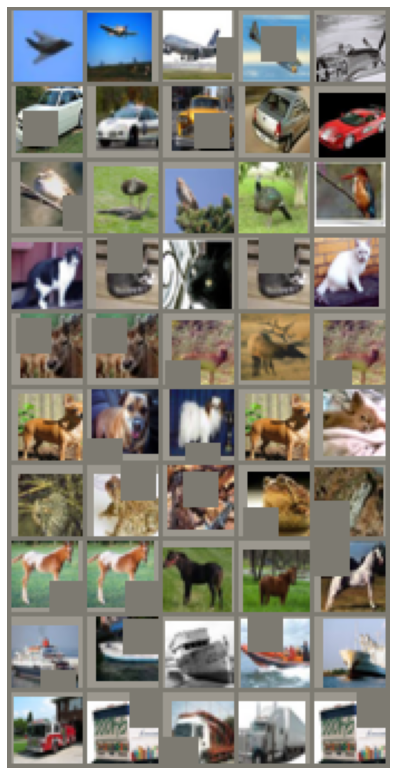

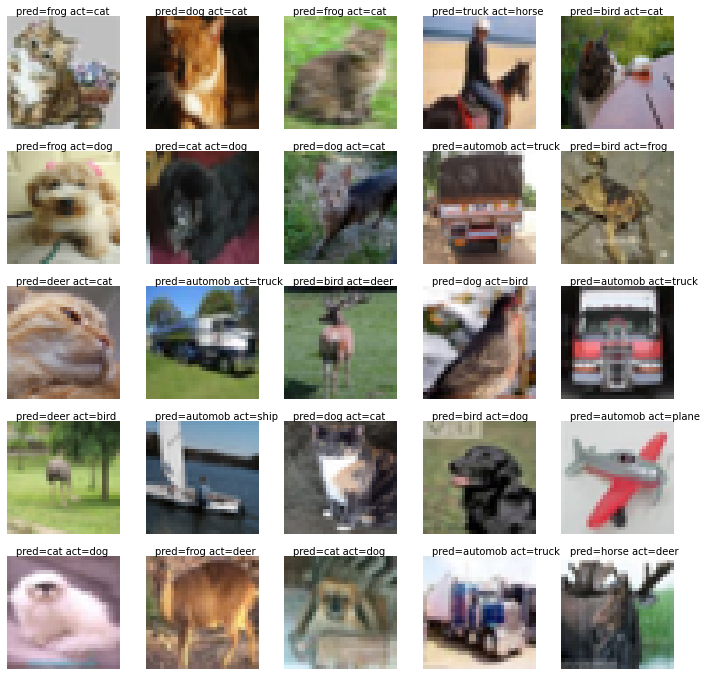

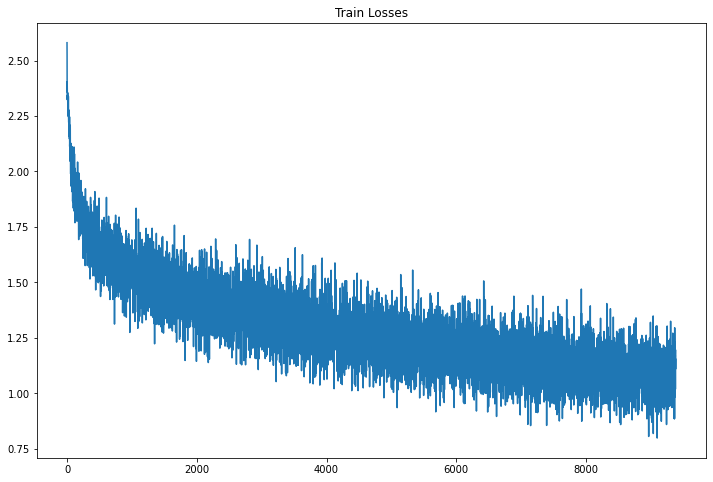

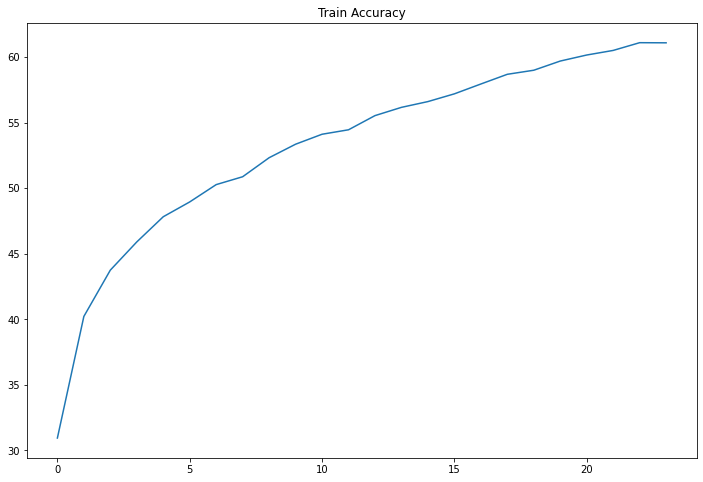

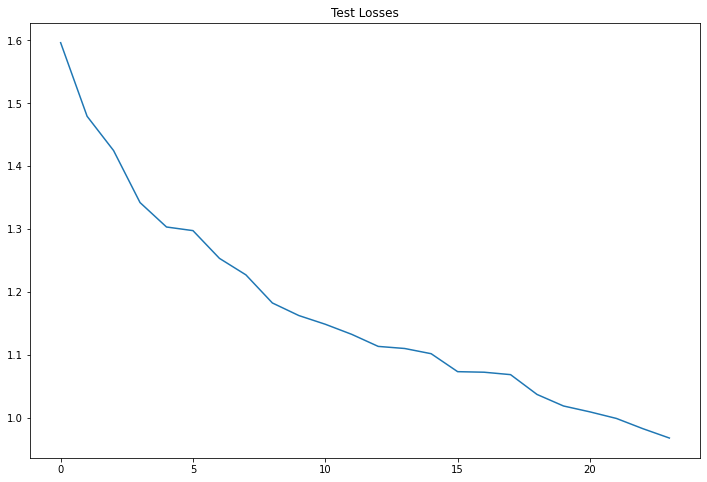

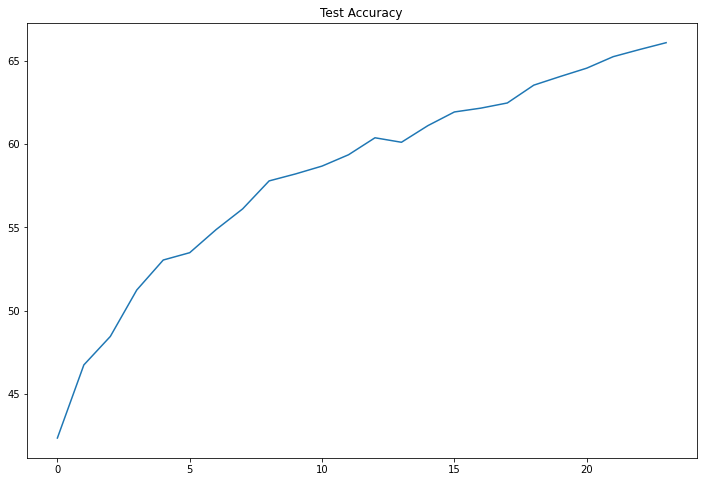

In [9]:
num_epochs = 24
main.s10_run_main(num_epochs, lr=1e-3)

In [10]:
%load_ext tensorboard

In [11]:
%tensorboard --logdir /content/gdrive/MyDrive/EVA8_P1_S10

<IPython.core.display.Javascript object>